Aulas 2 e 3 - Coleta, Organização, Limpeza e Imputação de Dados
===============================================================

Professor: Marcos Cesar Gritti  
Email: cesargritti@gmail.com

Antes de começar:
 - Caso seu ambiente Anaconda não possua uma das dependências necessárias para a execução do código contigo neste notebook, abra uma célula e execute o comando: ```!pip install -r ../requirements.txt```

Neste módulo vamos aprender sobre:
 1. **Como carregar dados de diferentes formatos em memória no nosso ambiente de desenvolvimento;**
 2. **Análise Exploratória;**
 3. **Tratamento de Dados;**
 4. **Imputação de dados;**
 5. **Normalização e estandardização de variáveis contínuas;**

1 - Carregando dados no ambiente de desenvolvimento
=============================================

No dia a dia de trabalho, um **Cientista de Dados** se depara com diferentes tipos fontes de dados. Nem sempre, em sua equipe, haverá um **Engenheiro de Dados** disponível para te ajudar a coletar dados de interesse em um formato fácil de integração com seu ambiente de desenvolvimento Python (ou qualquer outro ambiente de desenvolvimento científico), no nosso caso, o Jupyter Notebook. Portanto, é fundamental que você domine os principais formatos e/ou fontes existentes no mercado, para que não dependa de um terceiro para uma rápida prototipação/experimentação.

As principais fontes de dados, encontradas por um profissional da área, são:
 - Arquivos .csv;
 - Arquivos .json;
 - Arquivos .parquet;
 - Base de dados relacional SQL;
 - Base de dados não relacional NoSQL;

Em empresas que seguem a filosofia **Data Driven** haverá, usualmente, uma pedaço de Software chamado de *Camada de Ingestão de Dados*. Esta camada, desenvolvida por **Engenheiros de Dados**, tem por objetivo centralizar diversas fontes de informação bruta (arquivos csv, json, parquet, imagens, audios, etc ...) em um único repositório (ou **Buckets**). Este repositório centralizado recebe o nome de **Data Lake**, e é o ponto de partida para processos de ETL (*Extract, Transform and Load*), e também a forma mais fácil de um **Cientista de Dados** se servir de dados.

A consulta à base de dados SQL/NoSQL está fora do escopo deste módulo, contudo, com o domínio da linguagem Python para o processamento dos principais tipos de arquivo citados acima, . Tampouco trabalharemos, neste módulo, com processamento de imagens/audio.

1.1 - Arquivo .csv
----------------------

A existência de arquivos *csv* em **Data Lakes** não é predominante, pois, apesar de ser um arquivo fácil de se manipular, não é o mais eficiente (redução de espaço em disco e otimização de tempo de leitura). Entretanto, é o tipo de arquivo mais encontrado quando a informação ainda não está disponível no **Data Lake** (exportação de planilhas Excel, base de dados do IBGE, entre outras).

O arquivo csv é o melhor amigo do Pandas. Para carregar um arquivo em memória, utilizamos a função `read_csv`

```
dataset = pd.read_csv("caminho/do/arquivo.csv")
```

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from sklearn.linear_model import LinearRegression
from scipy.stats import chi2_contingency


import pylab 
import scipy.stats as stats

import statsmodels.api as sm

In [2]:
dados_csv = pd.read_csv("dados_brutos.csv")
dados_csv.head()

,uf,tipo,cod_localidade,feat_1,feat_2,feat_3,feat_4,loc_x,loc_y,mercado_mais_proximo,farmacia_mais_proxima,escola_mais_proxima,num_penit_4km,num_penit_500m,idade_imovel,area,preco
0,RJ,Tipo 1,Localidade 4,0.620648,9.967806,4.990882,25.124844,0.081382,0.727021,3603.941384,2002.686030,1124.043113,0.0,0.0,NaN,123.0,1348017
1,SP,Tipo 2,Localidade 4,0.817642,12.629695,5.466835,23.444343,0.367980,0.145812,2185.209139,683.811862,2462.825432,0.0,0.0,13.0,143.0,926601
2,RJ,Tipo 2,Localidade 3,0.793080,11.292156,4.201919,28.230731,0.332654,0.432904,1025.698339,957.451552,1049.112117,0.0,0.0,12.0,150.0,1627474
3,SC,Tipo 1,Localidade 4,0.792435,11.563047,5.459777,22.414837,0.159663,0.884596,NaN,3723.067390,1296.121182,0.0,0.0,8.0,160.0,1201041
4,RN,Tipo 1,Localidade 3,0.711696,11.655785,4.891314,25.451251,0.156154,0.836320,3925.306331,705.807343,4178.062758,0.0,0.0,12.0,134.0,1444848


1.2 - Arquivo .json
------------------------

É o formato mais utilizado por **Engenheiros de Software**, devido à sua compatibilidade com as tecnologias de desenvolvimento de APIs da atualidade. Consequentemente, a quantidade de arquivos *json* em **Data Lakes** é volumosa.

No *Pandas*, importa-se um arquivo *json* utilizando o comando `read_json`

In [3]:
dados_json = pd.read_json("dados_brutos.json")
dados_json.head()

,uf,tipo,cod_localidade,feat_1,feat_2,feat_3,feat_4,loc_x,loc_y,mercado_mais_proximo,farmacia_mais_proxima,escola_mais_proxima,num_penit_4km,num_penit_500m,idade_imovel,area,preco
700,ES,Tipo 1,None,0.638824,10.158127,4.874347,26.151255,0.632733,0.481356,341.680530,3456.862812,2557.124996,0.0,0.0,37.0,NaN,1329074
701,SP,Tipo 2,Localidade 4,0.794100,11.467263,4.889458,25.737262,0.290362,0.649488,3121.658324,2711.257761,2635.042549,0.0,0.0,4.0,151.0,980660
702,MS,Tipo 1,Localidade 4,0.745027,11.088365,4.644014,26.165747,0.117298,0.131615,1808.463617,1178.930223,1231.387072,0.0,NaN,15.0,170.0,1044861
703,PR,Tipo 1,Localidade 1,0.773947,12.182951,5.778339,21.948647,0.521053,0.021927,4189.517081,6402.599591,1738.502238,0.0,0.0,8.0,84.0,1347838
704,RO,Tipo 2,Localidade 1,0.686853,10.321383,4.589251,27.254870,0.985792,0.744716,385.176751,1630.761705,3446.457453,0.0,0.0,20.0,168.0,751177


1.3 - Arquivo .parquet
-------------------------------

É um formato de armazenamento colunar, disponível em todos os projetos do ecossistema *Hadoop*.
Em suma, um arquivo *parquet* permite armazenar e consultar o arquivo de forma eficiênte, o que justifica seu emprego na construção de **Data Lakes**.

https://parquet.apache.org/

A API do *Pandas* é intuitiva! Para carregar um arquivo *parquet*, utilizamos o método `pd.read_parquet` 

In [4]:
dados_parquet = pd.read_parquet("dados_brutos.parquet")
dados_parquet.head()

,uf,tipo,cod_localidade,feat_1,feat_2,feat_3,feat_4,loc_x,loc_y,mercado_mais_proximo,farmacia_mais_proxima,escola_mais_proxima,num_penit_4km,num_penit_500m,idade_imovel,area,preco
0,DF,Tipo 1,Localidade 1,0.865418,12.469136,4.428843,28.599545,0.039081,0.967402,6424.017248,2312.613264,922.096367,0.0,0.0,9.0,60.0,1283960
1,SC,Tipo 1,Localidade 2,0.794821,11.643225,5.745631,20.793361,0.163092,0.150923,1390.553671,7062.080907,6311.945099,0.0,0.0,6.0,135.0,691992
2,MG,Tipo 2,Localidade 1,0.765382,11.246786,4.435433,27.697589,0.519452,0.083601,NaN,5795.794123,1406.914318,0.0,0.0,17.0,162.0,1042605
3,SP,Tipo 2,Localidade 1,0.742807,10.807940,4.510181,28.549110,0.094447,0.229071,2811.748941,5112.857979,1954.494335,1.0,0.0,3.0,105.0,1132298
4,DF,Tipo 1,Localidade 4,0.708509,10.182098,5.581803,22.486957,0.398567,0.594843,3362.149025,1685.887551,1600.735664,0.0,0.0,5.0,137.0,1133084


1.4 - Exercício
---------------

Os dados da aula de hoje foram divididos em três arquivos, os quais carregamos nas células anteriores. Pesquise na documentação do *Pandas* como unir as linhas dos *dataframes* `dados_csv`, `dados_json` e `dados_parquet`, e um novo *dataframe* nominado `dados`.

https://pandas.pydata.org/docs/reference/index.html#api

Dica: **Concatenar** é a palavra chave de pesquisa

In [5]:
# Substitua a igualdade abaixo por uma que empilhe as linhas dos três conjuntos de 
# dados que carregamos anteriormente em apenas um conjunto de dados denominado `dados`
dados = pd.concat([dados_csv,dados_json,dados_parquet]).reset_index(drop=True)

2 - Análise exploratória
===================

Agora que carregamos os dados no *notebook*, precisamos explorá-los para encontrar eventuais inconsistências.
No dia a dia de trabalho de um *Cientista de Dados*, é muito comum encontrar:
 - Campos nulos (NaN);
 - Variáveis nominais não padronizadas (ex: "MAÇA", "maça", "MACA", "Maca ");
 - Variáveis contínuas (intervalar ou de razão) fora de escala;
 - Preenchimento incorreto de campos (ex: Espera-se nome da fruta, mas campo foi preenchido com o nome da cor);
 
Dentre as etapas do processo de **Mineração de Dados**, a *limpeza* do conjunto de dados é a que despende maior tempo, e que tem papel chave quanto ao sucesso do projeto. Por quê? Como veremos adiante, alguns algoritmos de *Aprendizado de Máquina* são gulosos, ou seja, encontrarão uma resposta até mesmo para os ruídos presentes no seu conjunto de treinamento (conceito de *Overfitting*).

Vamos começar identificando que variáveis existem no conjunto, e seus respectivos tipos, utilizando os comandos:
  - `dtypes`: para verificar o tipo de cada coluna;
  - `sample(N)`: para coletar uma pequena amostra que pode nos ajudar a sanar dúvidas sobre os tipos;

In [6]:
dados.dtypes

uf                        object
tipo                      object
cod_localidade            object
feat_1                   float64
feat_2                   float64
feat_3                   float64
feat_4                   float64
loc_x                    float64
loc_y                    float64
mercado_mais_proximo     float64
farmacia_mais_proxima    float64
escola_mais_proxima      float64
num_penit_4km            float64
num_penit_500m           float64
idade_imovel             float64
area                     float64
preco                      int64
dtype: object

In [7]:
dados.sample(5).T

,1232,350,2015,792,117
uf,PR,BA,GO,RJ,SP
tipo,Tipo 1,Tipo 1,Tipo 1,Tipo 1,Tipo 1
cod_localidade,Localidade 3,Localidade 3,Localidade 2,Localidade 2,Localidade 3
feat_1,0.877373,0.651501,0.75395,0.645919,0.677192
feat_2,13.245768,10.513379,11.207741,9.714391,9.792438
feat_3,5.69379,4.162565,5.267748,4.969537,4.25288
feat_4,21.756545,29.600242,23.823973,26.455467,29.219006
loc_x,0.424392,0.347614,0.955063,0.071288,0.156212
loc_y,0.760501,0.698126,0.444662,0.805995,0.603381
mercado_mais_proximo,2438.593855,1831.758129,1782.072826,5486.496091,2463.154631


Nosso conjunto de dados representa uma base imobiliária, e é formado pelas seguintes colunas:

| Nome                  | Descrição                                                             | Tipo               |
| ------------------    | ------------------------------------------------------                | ------------------ |
| uf                    | O estado onde o imóvel está localizado                                | object (string)    |
| tipo                  | O tipo do imóvel                                                      | object (string)    |
| cod_localidade        | Código qualitativo da localidade do imóvel (Consultoria)              | object (string)    |
| feat_1                | Feature 1 (Consultoria)                                               | float64            |
| feat_2                | Feature 2 (Consultoria)                                               | float64            |
| feat_3                | Feature 3 (Consultoria)                                               | float64            |
| feat_4                | Feature 4 (Consultoria)                                               | float64            |
| loc_x                 | Coordenada x do imóvel em um mapa local de referência (Consultoria)   | float64            |
| loc_y                 | Coordenada y do imóvel em um mapa local de referência (Consultoria)   | float64            |
| mercado_mais_proximo  | Distância do mercado mais próximo, em metros                          | float64            |
| farmacia_mais_proxima | Distância da farmácia mais próxima, em metros                         | float64            |
| escola_mais_proxima   | Distância da escola mais próxima, em metros                           | float64            |
| num_penit_4km         | Número de penitenciárias em um raio de 4km do imóvel                  | int64              |
| num_penit_500m        | Número de penitenciárias em um raio de 500m do imóvel                 | int64              |
| idade_imovel          | Idade do imóvel                                                       | int64              |
| area                  | Área do imóvel, em $m^2$                                              | float64            |
| preco                 | O preço do imóvel, em R$                                              | int64              |

* O tipo `int64`, no *Python*, representa o conjunto dos números naturais $\mathbb{N}$
* O tipo `float64`, no *Python*, representa o conjunto dos números reais $\mathbb{R}$
* O tipo `object`, no *Python*, pode representar uma **string** ou uma estrutura de dados composta (`list`, `dict`, classes customizadas, entre outras)

As variáveis `cod_localidade`, `feat_1`, `feat_2`, `feat_3`, `feat_4`, `loc_x` e `loc_y` foram elaboradas por um time de consultoria externa especializada em avaliação imobiliária. Sabemos que os códigos de qualidade contidos na coluna `cod_localidade` são utilizados para segmentar subregiões em níveis de qualidade, contudo, não sabemos se as categorias podem ser interpretadas como variáveis ordinais. Quanto às variáveis numéricas intervalares (`feat_1` à `feat_4`), sabe-se apenas que foram construídas com base em laudos históricos de avaliação de imóveis próximos, e com base em indicadores macro-econômicos.

Não existe uma receita de bolo exata para tratamento de dados, uma vez que a natureza e as regras de negócio variam muito de problema à problema. Para este caso de estudo, vamos começar verificando o conteúdo das variáveis de tipo `object` (assumindo como premissa de que são categoricas). Como já sabemos que estes campos estão armazenando valores do tipo `string`, uma boa pergunta inicial seria: Quais os possíveis valores destes campo?

Para responder a esta pergunta, podemos utilizar a função `unique`:

In [8]:
# Valores únicos de UF (incluíndo valores nulos, i.e., NaN)
dados.uf.unique()

array(['RJ', 'SP', 'SC', 'RN', 'CE', 'MG', 'ES', 'RO', 'DF', 'MS', 'PR',
       'GO', 'AC', 'BA', 'MT', 'AL', 'RS', 'PB', 'TO', 'AM', 'AP', 'SE',
       'RR', 'PI', 'MA', 'PE', 'PA', nan, None], dtype=object)

In [9]:
# Valores únicos de tipo
dados.tipo.unique()

array(['Tipo 1', 'Tipo 2', 'TIPO 1', 'tipo 2', nan, 'TIPO 2',
       'LOCALIDADE 6', 'Localidade 9', 'Localidade 8', 'tipo 1',
       'Localidade 6', 'Tipo 3', 'Tipo 4', None, 'Localidade 10',
       'Localidade 5', 'TIPO 4', 'tipo 3', 'Localidade 7'], dtype=object)

In [10]:
# Valores únicos de localidade
dados.cod_localidade.unique()

array(['Localidade 4', 'Localidade 3', 'localidade 4', 'Localidade 2',
       'Localidade 9', 'Localidade 1', 'Localidade 7', 'localidade 3',
       'LOCALIDADE 2', 'localidade 1', 'LOCALIDADE 1', nan,
       'Localidade 8', 'Tipo 3', 'localidade 2', 'LOCALIDADE 3',
       'localidade 9', 'LOCALIDADE 4', 'Tipo 2', 'Localidade 5',
       'Localidade 6', None, 'localidade 5', 'Tipo 4', 'Localidade 10',
       'tipo 4', 'localidade 7'], dtype=object)

In [11]:
dados.describe().T

,count,mean,std,min,25%,50%,75%,max
feat_1,2022.0,0.751808,0.103431,0.222897,0.684783,0.754352,8.201856e-01,1.277357e+00
feat_2,2022.0,11.304705,1.654269,3.067246,10.239090,11.362082,1.238432e+01,1.870217e+01
feat_3,2016.0,5.004588,0.514403,3.214858,4.655714,4.999201,5.347276e+00,6.638993e+00
feat_4,2023.0,24.978204,2.627059,15.850045,23.158389,25.002898,2.680118e+01,3.349520e+01
loc_x,2020.0,0.505169,0.288890,0.000530,0.250194,0.508069,7.473581e-01,9.997262e-01
loc_y,2023.0,0.501737,0.286487,0.000855,0.254863,0.510660,7.463950e-01,9.995796e-01
mercado_mais_proximo,1953.0,3086.351775,1714.499709,37.932408,1794.086282,2816.375170,4.090446e+03,9.733443e+03
farmacia_mais_proxima,1966.0,2675.509079,1538.196595,49.678746,1476.145321,2397.733125,3.622657e+03,8.063493e+03
escola_mais_proxima,1964.0,2429.899456,1318.803468,63.839485,1432.287866,2240.663181,3.273253e+03,7.336996e+03
num_penit_4km,2017.0,0.302925,0.468191,0.000000,0.000000,0.000000,1.000000e+00,2.000000e+00


**O que é quantil/percentil/quartil?**

Quantils são pontos estabelecidos em intervalos regulares em uma lista ordenada que informa o percentual de dados abaixo de um limiar em uma amostra.

Exemplo de cálculo de quantil:

Dada uma lista de valores desordenados $[5, 3, 1, 10, 4]$ o quantil nos diz o número índice da lista no qual $x$% da população (elementos da lista) são menores do que o valor apontado pelo índice. Por exemplo, se ordenarmos a lista de forma crescente, obtemos $[1, 3, 4, 5, 10]$.

Para calcular o quantil 0.5 (equivalente a mediana, e também ao segundo quartil), basta encontrar o índice central da lista. Nesta caso, a lista contém 5 elementos, sendo o índice 3 seu elemento central. Logo, nosso $q_{0.5} = 4$, significando que 50% dos dados de nossa amostra são menores que 4.

Equivalências:

| Quantil | Quartil | Percentil |
| ------- | ------- | --------- |
| 0.25    | 1       | 25%       |
| 0.5     | 2       | 50%       |
| 0.75    | 3       | 75%       |

A combinação de quantils com outras propriedades de uma amostra (como a média, valor mínimo, máximo e variância) nos fornece uma visão precisa da distribuição dos dados sob observação. Com o auxílio da biblioteca `seaborn`, podemos criar representação pictóricas destas informações, como no caso do Diagrama de Caixas (`boxplot`) e o Diagrama Violino (`violinplot`) apresentado abaixo: 


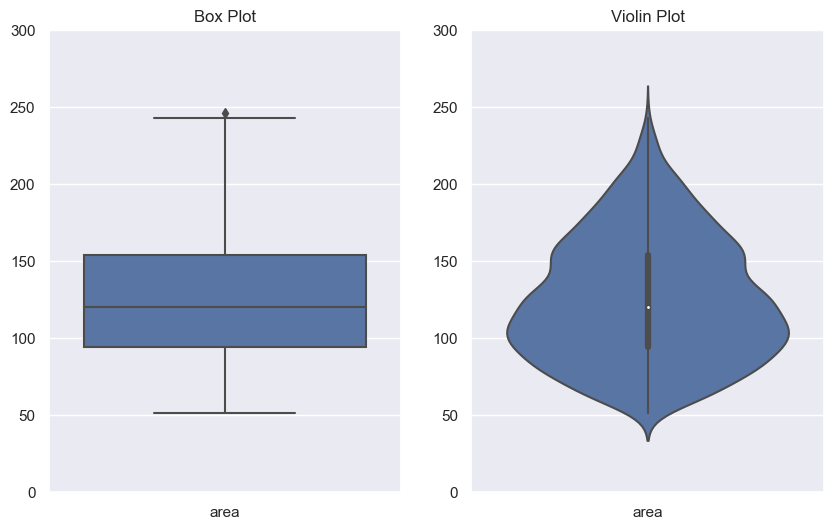

In [12]:
# Ajustando o tamanho padrão das imagens e fontes
sns.set(font_scale=1.0, rc={
    "figure.figsize": (10, 6),
})

ax = plt.subplot(121)
sns.boxplot(data=dados[["area"]], ax=ax)
plt.title("Box Plot"); plt.ylim([0, 300]);

ax = plt.subplot(122)
sns.violinplot(data=dados[["area"]], ax=ax)
plt.title("Violin Plot"); plt.ylim([0, 300]);

Podemos utilizar o argumento `hue` do `seaborn` para segmentar visualizações por categorias distintas com o emprego de cores.

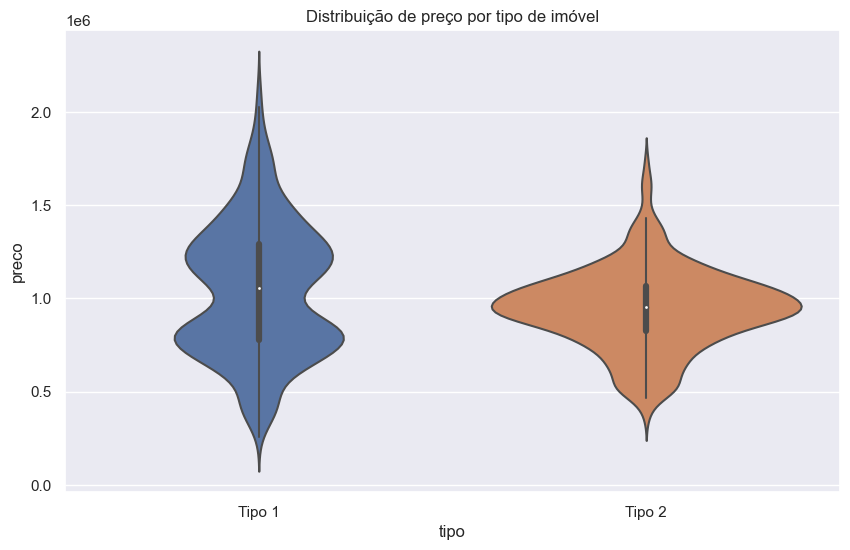

In [13]:
fig, ax = plt.subplots()
sns.violinplot(
    data=dados[dados.tipo.isin(["Tipo 1", "Tipo 2"])][["preco", "tipo"]], 
    y="preco", 
    x="tipo", 
    ax=ax
)
plt.title("Distribuição de preço por tipo de imóvel");

Além da distribuição das variáveis do nosso conjunto de dados (Análise Descritiva Univariada), podemos explorar relações entre pares utilizando a visualização `pairplot` do `seaborn` (Análise Descritiva Multivariada), que combina Funções de Densidade de Probabilidade (FDP, em inglês, *Probability Density Function*) com Gráficos de Disperção (`scatterplot`), como demonstrado na célula a seguir.

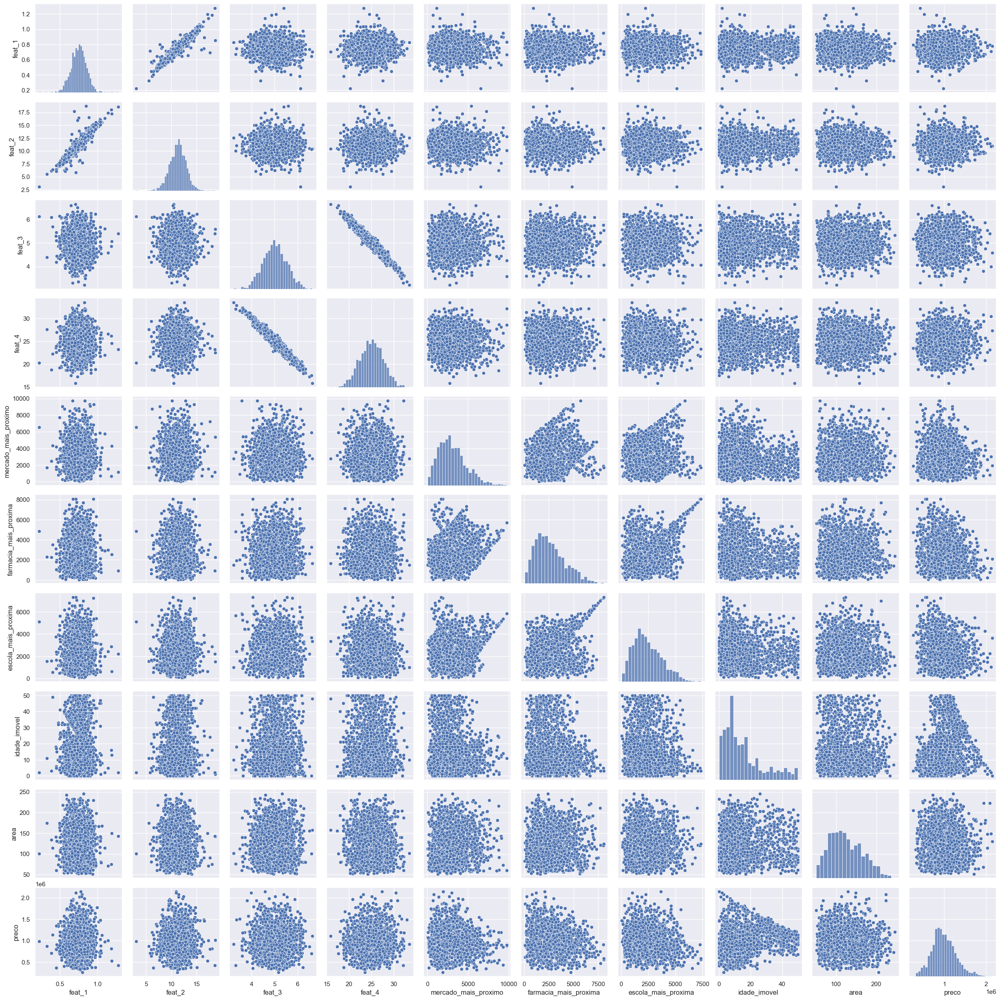

In [14]:
#A função .drop descarta algumas colunas do nosso DataFrame
sns.pairplot(
    dados.drop(columns=["loc_x", "loc_y", "num_penit_4km", "num_penit_500m"])
)

Utilizando a função `corr` do **Pandas**, junto com a visualização de mapa de calor do `heatmap` do `seaborn`, é possível criar um correlograma para mensurar, visualmente, as correlações entre as variáveis do conjunto de dados. Um adendo: a função `corr` admite apenas valores numéricos. Para contornar esse problema, podemos usar a função `select_dtypes` com o argumento `exclude="object"` para selecionar todas as colunas em que o tipo é diferente de `object`, ou seja, apenas as colunas que contém valores numéricos.

<Axes: >

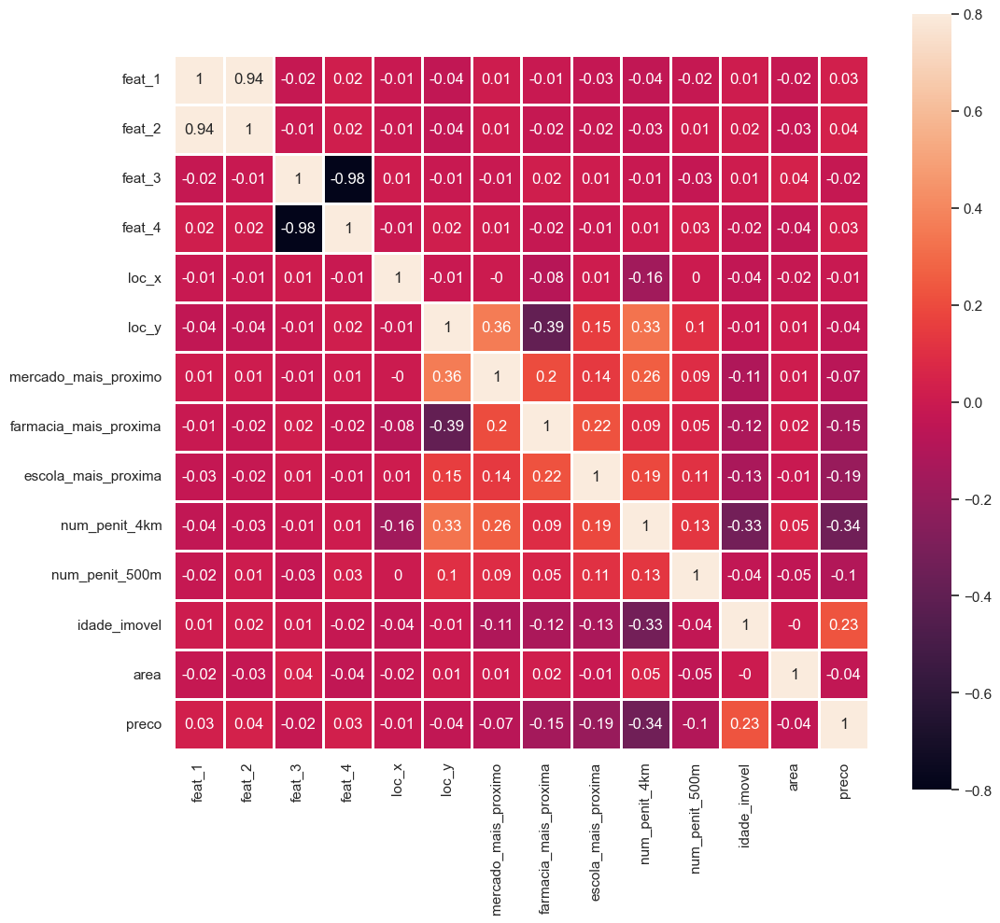

In [15]:
corr = dados.select_dtypes(exclude="object").corr().round(2)
fig, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(corr, 
            annot=True,
            square=True, 
            vmax=.8,
            vmin=-.8,
            linewidths=2, 
            cbar_kws={"shrink": .9})

3 - Exercício
=============

O conjunto de arquivos de dados imobiliários contém erros sistemáticos, dados faltantes e outliers.

**Atividades**:

- Padronize as variáveis categóricas **tipo** e **cod_localidade**, remova as linhas com erros sistemáticos, e remove possíveis outliers (tipos ou localidades com frequência baixa);
- Para cada registro da base de dados, encontre a **regiao** por meio da coluna **uf** utilizando a base de estados do ibge disponibilizada para o exercício; 
- Realize a imputação de dados sobre as variáveis **feat_1**, **feat_2**, **feat_3** e **feat_4** utilizando regressão linear simples. Lembre-se que a partir da análise exploratória dos dados observa-se que **feat_1** tem correlação com **feat_2**, assim como **feat_3** tem correlação com **feat_4**, ou seja, precisamos encontrar duas equações:
  - $feat_1 = k_1 + c_1 feat_2$
  - $feat_3 = k_2 + c_2 feat_4$
- Remova os outliers dos pares de variáveis (**feat_1**, **feat_2**) e (**feat_3**, **feat_4**) utilizando o método z-score multidimensional;
- Identifique se existem outras variávies do conjunto com outliers, e, caso existam, remova os outliers citando a natureza da variável e o méteodo utilizado para identificação dos outliers;
- Após finalizar as atividades citadas anteriormente, remova todos os dados faltantes ainda presentes no conjunto de dados;
- Realize uma análise exploratória completa do conjunto de dados tratado;
- Salve o arquivo final em formato **parquet** com o nome *dados_tratados.parquet*;

**Informações adicionais**:

O prazo total para entrega do exercício é de 8 dias corridos, iniciando contagem a partir da data de disponibilização do exercício no Moodle;

A entrega deve ser feita no Moodle. Contudo, o exercício pode ser entregue em um arquivo comprimido **OU** via link compartilhado de um *fork* do projeto no github (ou alguma outra ferramenta de versionamento de código). Fica a critério do aluno escolher a melhor forma de entrega;

O arquivo (ou repositório git) da entrega, deve conter, obrigatóriamente:
- Uma cópia deste notebook (`exercicio.ipynb`) com a resolução das atividades;
- O arquivo `dados_tratados.parquet`, resultando do tratamento final da base de dados;

#### Padronização das variáveis

In [16]:
# Standardize the "tipo" column
dados['tipo'] = dados['tipo'].str.lower().str.strip()

# Unique values of "tipo" after standardization
unique_types = dados['tipo'].unique()
print(unique_types)

['tipo 1' 'tipo 2' nan 'localidade 6' 'localidade 9' 'localidade 8'
 'tipo 3' 'tipo 4' None 'localidade 10' 'localidade 5' 'localidade 7']


In [17]:
# Standardize the "cod_localidade" column
dados['cod_localidade'] = dados['cod_localidade'].str.lower().str.strip()

# Unique values of "cod_localidade" after standardization
unique_localities = dados['cod_localidade'].unique()
print(unique_localities)

['localidade 4' 'localidade 3' 'localidade 2' 'localidade 9'
 'localidade 1' 'localidade 7' nan 'localidade 8' 'tipo 3' 'tipo 2'
 'localidade 5' 'localidade 6' None 'tipo 4' 'localidade 10']


#### Remoção de linhas com erros sistemáticos

In [18]:
# Filter rows that do not contain the word "type" in the "type" column
dados = dados[dados['tipo'].str.contains('tipo', na=False)]

# Unique values of "type" after filtering
print(dados['tipo'].unique())

['tipo 1' 'tipo 2' 'tipo 3' 'tipo 4']


In [19]:
# Filter rows that do not contain the word "localidade" in the "cod_localidade" column
dados = dados[dados['cod_localidade'].str.contains('localidade', na=False)]

# Unique values of cod_localidade after filtering
print(dados['cod_localidade'].unique())

['localidade 4' 'localidade 3' 'localidade 2' 'localidade 9'
 'localidade 1' 'localidade 7' 'localidade 8' 'localidade 5'
 'localidade 6' 'localidade 10']


#### Remoção de Outliers


In [20]:
# Frequency count of the "tipo" column
type_frequency = dados['tipo'].value_counts()
print(type_frequency)

tipo
tipo 2    978
tipo 1    859
tipo 3      7
tipo 4      5
Name: count, dtype: int64


In [21]:
# Frequency count of the "cod_localidade" column
locality_frequency = dados['cod_localidade'].value_counts()
print(locality_frequency)

cod_localidade
localidade 4     464
localidade 2     462
localidade 3     460
localidade 1     443
localidade 7       5
localidade 8       5
localidade 9       3
localidade 5       3
localidade 6       3
localidade 10      1
Name: count, dtype: int64


In [22]:
# Define the minimum frequency desired for "tipo" and "cod_localidade"
minimum_frequency_tipo = 800
minimum_frequency_localidade = 400

# Remove potential outliers based on the minimum frequency in "tipo"
dados = dados.groupby('tipo').filter(lambda x: len(x) >= minimum_frequency_tipo)

# Remove potential outliers based on the minimum frequency in "cod_localidade"
dados = dados.groupby('cod_localidade').filter(lambda x: len(x) >= minimum_frequency_localidade)

In [23]:
# Frequency count of the column "tipo"
frequency_tipo = dados['tipo'].value_counts()
print(frequency_tipo)

tipo
tipo 2    970
tipo 1    849
Name: count, dtype: int64


In [24]:
# Frequency count of the column "cod_localidade"
frequency_localidade = dados['cod_localidade'].value_counts()
print(frequency_localidade)

cod_localidade
localidade 4    462
localidade 3    457
localidade 2    457
localidade 1    443
Name: count, dtype: int64


#### Encontrando a região

In [25]:
# Load the states file
region = pd.read_csv("estados.csv")

# Perform the merge between the datasets, using the "uf" column as the joining key
dados = dados.merge(region[['uf', 'regiao']], how='left', on='uf')

In [26]:
dados.sample(5).T

,34,487,1713,348,1383
uf,RJ,MS,AL,MG,RJ
tipo,tipo 1,tipo 1,tipo 2,tipo 1,tipo 2
cod_localidade,localidade 2,localidade 4,localidade 3,localidade 3,localidade 3
feat_1,0.755011,0.704067,0.868354,0.799468,0.725902
feat_2,11.1875,10.038916,13.019355,11.676908,11.321801
feat_3,5.66962,5.843416,4.510333,4.636419,4.171691
feat_4,22.45498,21.130449,27.259024,27.66612,29.129124
loc_x,0.227741,0.679849,0.228206,0.818434,0.504276
loc_y,0.890048,0.514288,0.856105,0.500433,0.568007
mercado_mais_proximo,5751.943515,4136.86466,3725.945152,2208.36634,1262.348682


#### Realize a imputação de dados sobre as variáveis feat_1, feat_2, feat_3 e feat_4

In [27]:
# Split the dataset into two groups
grupo1 = dados[['feat_1', 'feat_2']].dropna()
grupo2 = dados[['feat_3', 'feat_4']].dropna()

# Perform simple linear regression to estimate feat_1 based on feat_2
regressor1 = LinearRegression()
regressor1.fit(grupo1[['feat_2']], grupo1['feat_1'])
k1 = regressor1.intercept_
c1 = regressor1.coef_[0]

# Perform simple linear regression to estimate feat_3 based on feat_4
regressor2 = LinearRegression()
regressor2.fit(grupo2[['feat_4']], grupo2['feat_3'])
k2 = regressor2.intercept_
c2 = regressor2.coef_[0]

# Impute missing values using the obtained equations
dados['feat_1'].fillna(k1 + c1 * dados['feat_2'], inplace=True)
dados['feat_3'].fillna(k2 + c2 * dados['feat_4'], inplace=True)

In [28]:
# Print the intercept and coefficients obtained from linear regression
print("Intercept k1:", k1)
print("Coefficient c1:", c1)
print("Intercept k2:", k2)
print("Coefficient c2:", c2)

Intercept k1: 0.09053668224875322
Coefficient c1: 0.0584890051593737
Intercept k2: 9.797263013026154
Coefficient c2: -0.19187122069399437


#### Remova os outliers dos pares de variáveis

In [29]:
# Calculate the z-scores for the variable pairs (feat_1, feat_2) and (feat_3, feat_4)
z_scores_1 = np.abs((dados['feat_1'] - dados['feat_1'].mean()) / dados['feat_1'].std())
z_scores_2 = np.abs((dados['feat_2'] - dados['feat_2'].mean()) / dados['feat_2'].std())
z_scores_3 = np.abs((dados['feat_3'] - dados['feat_3'].mean()) / dados['feat_3'].std())
z_scores_4 = np.abs((dados['feat_4'] - dados['feat_4'].mean()) / dados['feat_4'].std())

# Define the z-score threshold
z_score_threshold = 3

#Identify the outliers
outliers_1 = np.where(z_scores_1 > z_score_threshold)[0]
outliers_2 = np.where(z_scores_2 > z_score_threshold)[0]
outliers_3 = np.where(z_scores_3 > z_score_threshold)[0]
outliers_4 = np.where(z_scores_4 > z_score_threshold)[0]

# Get all the outlier indices
outliers = np.unique(np.concatenate((outliers_1, outliers_2, outliers_3, outliers_4)))

# Remove the outliers from all variable pairs
dados = dados.drop(outliers)

In [30]:
print("Z-scores for feat_1:")
print(z_scores_1)

Z-scores for feat_1:
0       1.253436
1       0.631008
2       0.396050
3       0.389877
4       0.382476
          ...   
1814    0.798986
1815    1.645767
1816    1.248351
1817    0.468635
1818    0.272216
Name: feat_1, Length: 1819, dtype: float64


In [31]:
print("Z-scores for feat_2:")
print(z_scores_2)

Z-scores for feat_2:
0       0.798884
1       0.787727
2       0.009510
3       0.151954
4       0.207230
          ...   
1814    0.706005
1815    1.568963
1816    0.994897
1817    0.239442
1818    0.136877
Name: feat_2, Length: 1819, dtype: float64


In [32]:
print("Z-scores for feat_3:")
print(z_scores_3)

Z-scores for feat_3:
0       0.018950
1       0.898162
2       1.539202
3       0.884562
4       0.210809
          ...   
1814    1.452449
1815    0.428165
1816    0.246417
1817    0.004225
1818    0.244384
Name: feat_3, Length: 1819, dtype: float64


In [33]:
print("Z-scores for feat_4:")
print(z_scores_4)

Z-scores for feat_4:
0       0.047260
1       0.585799
2       1.217272
3       0.973622
4       0.170220
          ...   
1814    1.359002
1815    0.300278
1816    0.494429
1817    0.119737
1818    0.382941
Name: feat_4, Length: 1819, dtype: float64


In [34]:
def filter(df, columns, n_stds=2.576):
    # Make a copy of the dataframe to preserve the original
    df = df.copy()
    
    # Extract the values of the target columns
    X = df[columns].values
    
    # Calculate the mean of the columns
    mean = X.mean(axis=0)
    
    # Calculate the covariance matrix of the columns
    cov = np.cov(X, rowvar=0)
    
    # Calculate the eigenvalues and eigenvectors of the covariance matrix
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    
    # Apply the n-dimensional z-score transformation to the data
    Z = (X - mean).dot(vecs)
    Zstd = np.sqrt(np.diag(np.cov(Z, rowvar=0)))
    Zvals = Z / Zstd
    
    # Calculate the distances of the points to the origin
    D = np.sqrt((Zvals ** 2).sum(axis=1))
    
    # Classify the points as outliers or not based on the cutoff point
    df["outlier"] = np.abs(D) >= n_stds
    
    # Return the dataframe with the "outlier" column added
    return df

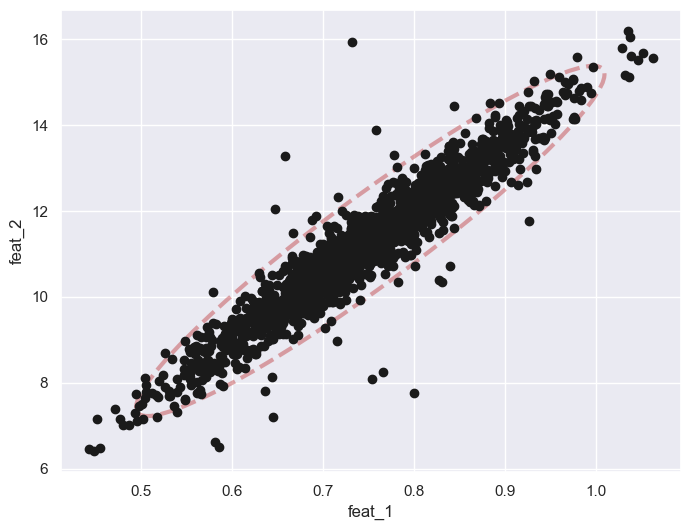

In [35]:
# Scatter plot for feat_1 and feat_2
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(dados["feat_1"], dados["feat_2"], 'k.', ms=12)
plt.xlabel("feat_1")
plt.ylabel("feat_2")

subset1 = dados[~dados['feat_1'].isna() & ~dados['feat_2'].isna()]
stack1 = np.vstack([subset1['feat_1'], subset1['feat_2']])
mean1 = stack1.mean(axis=1)
cov1 = np.cov(stack1, rowvar=True)

vals1, vecs1 = np.linalg.eigh(cov1)
order1 = vals1.argsort()[::-1]
theta1 = np.degrees(np.arctan2(*vecs1[:, order1][:, 0][::-1]))

width1, height1 = 2 * 2.576 * np.sqrt(vals1[order1])
ellip1 = Ellipse(xy=mean1, width=width1, height=height1, angle=theta1, color="r", ls="--", lw=3, fc=None, fill=False, alpha=0.5)
ax.add_artist(ellip1)

plt.show()

<Axes: xlabel='feat_1', ylabel='feat_2'>

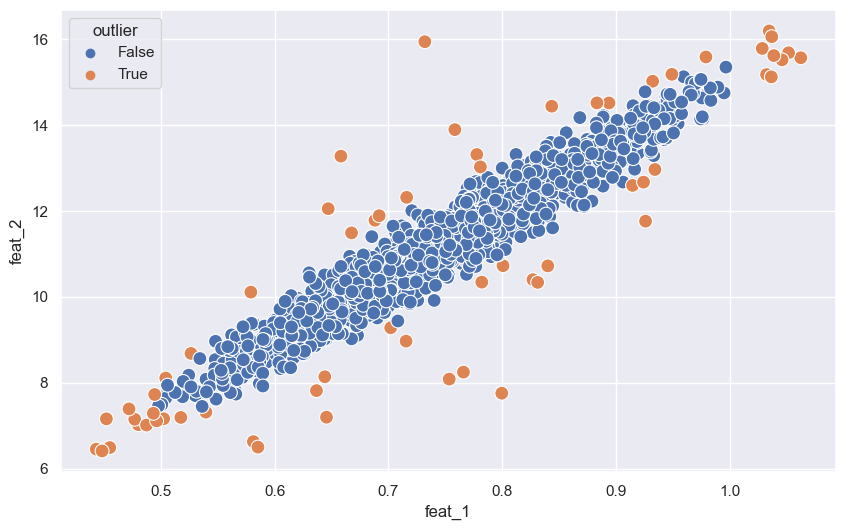

In [36]:
f1 = dados[(~(dados['feat_1'].isna()) & ~(dados['feat_2'].isna()))][['feat_1', 'feat_2']]

# Applying the routine
f1 = filter(f1,['feat_1', 'feat_2'])

# Plotting the scatterplot with outliers highlighted
sns.scatterplot(data=f1, x='feat_1', y='feat_2', hue='outlier', s=100)

In [37]:
# Filtering the rows with outliers
out1 = f1.query("outlier == True")

# Assigning the 'outlier' column to 'outlier1'
f1['out1'] = f1['outlier']

# Merging the 'outlier1' column back into 'dados'
dados = dados.merge(f1[['out1']], how='left', left_index=True, right_index=True)

# Querying the rows in 'dados' with outliers
dados.query("out1 == True")

,uf,tipo,cod_localidade,feat_1,feat_2,feat_3,feat_4,loc_x,loc_y,mercado_mais_proximo,farmacia_mais_proxima,escola_mais_proxima,num_penit_4km,num_penit_500m,idade_imovel,area,preco,regiao,out1
11,MS,tipo 2,localidade 4,0.645642,7.196911,5.237109,23.072962,0.905381,0.317289,3815.334934,4563.944918,1060.486648,0.0,0.0,9.0,137.0,762396,REGIAO CENTRO-OESTE,True
31,SP,tipo 1,localidade 3,0.480254,7.023826,4.858319,24.352386,0.515254,0.192295,806.437213,3977.952685,1168.077573,0.0,0.0,33.0,129.0,1387763,REGIAO SUDESTE,True
46,RJ,tipo 2,localidade 1,0.827131,10.401739,3.896580,30.057138,0.422951,0.133550,2763.987709,5168.283517,348.970027,1.0,0.0,4.0,100.0,1213158,REGIAO SUDESTE,True
49,PR,tipo 2,localidade 4,0.517569,7.192207,6.055833,19.611682,0.923568,0.539645,5462.397561,3677.148004,2044.236616,0.0,0.0,11.0,86.0,806969,REGIAO SUL,True
109,AM,tipo 2,localidade 4,0.800809,10.726527,4.244126,27.741737,0.482590,0.819140,5590.378664,2142.621486,3737.088757,1.0,0.0,8.0,119.0,541952,REGIAO NORTE,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1694,MG,tipo 2,localidade 1,0.979214,15.589690,5.439755,23.285294,0.701082,0.050335,5086.487374,5476.342547,2188.816738,0.0,0.0,13.0,72.0,1082701,REGIAO SUDESTE,True
1745,SP,tipo 1,localidade 4,0.780934,13.028561,5.525732,23.350409,0.208656,0.424889,813.910662,1925.509474,1337.630741,0.0,0.0,13.0,175.0,1200757,REGIAO SUDESTE,True
1747,MG,tipo 1,localidade 3,1.036695,15.125645,5.043903,24.821704,0.855626,0.420204,2635.514158,2154.267565,2004.701434,0.0,0.0,31.0,131.0,1478663,REGIAO SUDESTE,True
1763,AL,tipo 1,localidade 4,0.494550,7.726373,5.063402,24.781055,0.648510,0.958589,7717.755065,3473.797923,4804.136664,1.0,0.0,4.0,175.0,883406,REGIAO NORDESTE,True


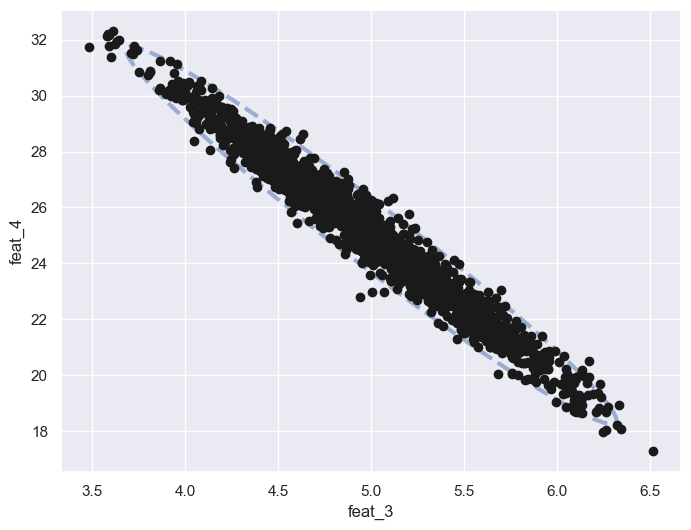

In [38]:
# Scatter plot for feat_3 and feat_4
fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(dados["feat_3"], dados["feat_4"], 'k.', ms=12)
plt.xlabel("feat_3")
plt.ylabel("feat_4")

subset2 = dados[~dados['feat_3'].isna() & ~dados['feat_4'].isna()]
stack2 = np.vstack([subset2['feat_3'], subset2['feat_4']])
mean2 = stack2.mean(axis=1)
cov2 = np.cov(stack2, rowvar=True)

vals2, vecs2 = np.linalg.eigh(cov2)
order2 = vals2.argsort()[::-1]
theta2 = np.degrees(np.arctan2(*vecs2[:, order2][:, 0][::-1]))

width2, height2 = 2 * 2.576 * np.sqrt(vals2[order2])
ellip2 = Ellipse(xy=mean2, width=width2, height=height2, angle=theta2, color="b", ls="--", lw=3, fc=None, fill=False, alpha=0.5)
ax.add_artist(ellip2)

plt.show()

<Axes: xlabel='feat_3', ylabel='feat_4'>

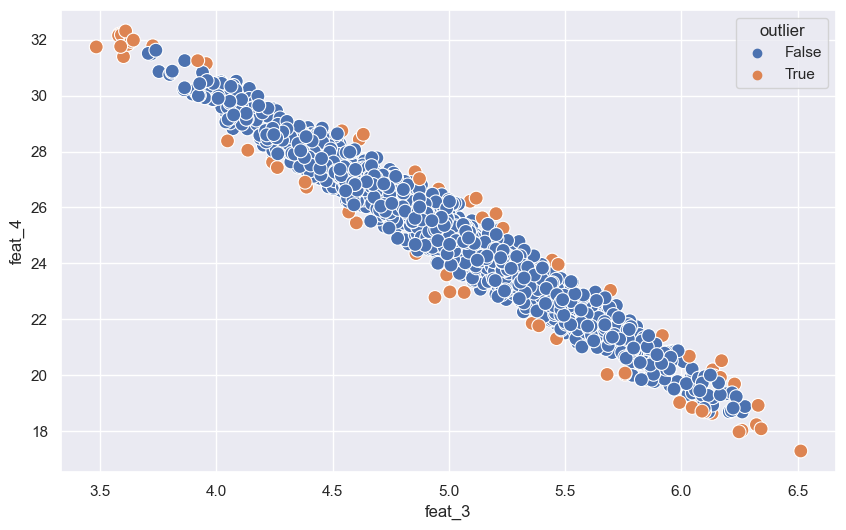

In [39]:
f3 = dados[(~(dados['feat_3'].isna()) & ~(dados['feat_4'].isna()))][['feat_3', 'feat_4']]

# Applying the routine
f3 = filter(f3,['feat_3', 'feat_4'])

# Plotting the scatterplot with outliers highlighted
sns.scatterplot(data=f3, x='feat_3', y='feat_4', hue='outlier', s=100)

In [40]:
# Filtering the rows with outliers
out3 = f3.query("outlier == True")

# Assigning the 'outlier' column to 'outlier1'
f3['out3'] = f3['outlier']

# Merging the 'outlier1' column back into 'dados'
dados = dados.merge(f3[['out3']], how='left', left_index=True, right_index=True)

# Querying the rows in 'dados' with outliers
dados.query("out3 == True")

,uf,tipo,cod_localidade,feat_1,feat_2,feat_3,feat_4,loc_x,loc_y,mercado_mais_proximo,farmacia_mais_proxima,escola_mais_proxima,num_penit_4km,num_penit_500m,idade_imovel,area,preco,regiao,out1,out3
31,SP,tipo 1,localidade 3,0.480254,7.023826,4.858319,24.352386,0.515254,0.192295,806.437213,3977.952685,1168.077573,0.0,0.0,33.0,129.0,1387763,REGIAO SUDESTE,True,True
36,SC,tipo 2,localidade 3,0.801949,12.209875,5.091425,26.224085,0.868252,0.032938,3335.357176,1633.473006,NaN,0.0,0.0,15.0,132.0,1381780,REGIAO SUL,False,True
117,SP,tipo 1,localidade 3,0.807716,11.686965,5.992308,19.024466,0.266960,0.800969,3063.867350,651.220813,3044.423639,0.0,0.0,18.0,108.0,1677435,REGIAO SUDESTE,False,True
123,MS,tipo 1,localidade 2,0.622718,9.669908,4.955926,26.659603,0.059433,0.166903,915.496517,7512.181940,6821.221328,0.0,0.0,5.0,91.0,663797,REGIAO CENTRO-OESTE,False,True
140,SP,tipo 1,localidade 4,0.836901,12.850630,4.241396,27.622058,0.205838,0.757952,3899.868910,2780.020220,1805.213566,0.0,0.0,10.0,162.0,1290059,REGIAO SUDESTE,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1724,SP,tipo 1,localidade 2,0.828896,12.633684,5.004420,22.979585,0.671374,0.049756,NaN,3265.985667,3988.904007,0.0,0.0,11.0,98.0,799403,REGIAO SUDESTE,False,True
1726,AC,tipo 1,localidade 1,0.626328,8.732805,4.381461,26.904540,0.557008,0.495954,2554.070117,2234.562003,714.932215,0.0,0.0,5.0,113.0,1161261,REGIAO NORTE,False,True
1729,SC,tipo 2,localidade 2,0.764257,11.885240,5.757633,20.076970,0.959122,0.318994,2443.991851,622.852880,2689.846612,0.0,0.0,6.0,146.0,843251,REGIAO SUL,False,True
1741,SP,tipo 2,localidade 1,0.852433,13.200504,4.631795,28.618524,0.384618,0.585206,2029.153383,651.970571,2335.760884,1.0,0.0,8.0,142.0,1096124,REGIAO SUDESTE,False,True


In [41]:
# Select only the numeric variables to identify outliers
numeric_variables = ['feat_1', 'feat_2', 'feat_3', 'feat_4', 'loc_x', 'loc_y', 'mercado_mais_proximo', 'farmacia_mais_proxima', 'escola_mais_proxima', 'num_penit_4km', 'num_penit_500m', 'idade_imovel', 'area', 'preco']

# Calculate the z-scores for the numeric variables
z_scores = dados[numeric_variables].apply(lambda x: np.abs((x - x.mean()) / x.std()))

# Set the z-score threshold
z_score_threshold = 3

# Identify the outliers for each variable
outliers = z_scores > z_score_threshold

# Remove the outliers from the identified variables
dados_without_outliers = dados[~outliers.any(axis=1)]

# Example of result showing the variables and the number of removed outliers
for variable in numeric_variables:
    num_outliers = outliers[variable].sum()
    print(f"Variable: {variable}, Outliers removed: {num_outliers}")

Variable: feat_1, Outliers removed: 3
Variable: feat_2, Outliers removed: 6
Variable: feat_3, Outliers removed: 0
Variable: feat_4, Outliers removed: 0
Variable: loc_x, Outliers removed: 0
Variable: loc_y, Outliers removed: 0
Variable: mercado_mais_proximo, Outliers removed: 15
Variable: farmacia_mais_proxima, Outliers removed: 6
Variable: escola_mais_proxima, Outliers removed: 8
Variable: num_penit_4km, Outliers removed: 6
Variable: num_penit_500m, Outliers removed: 14
Variable: idade_imovel, Outliers removed: 0
Variable: area, Outliers removed: 0
Variable: preco, Outliers removed: 11


O código realiza a identificação e remoção de outliers em um conjunto de variáveis numéricas. Utilizando o método z-score, calcula-se a pontuação de desvio em relação à média para cada variável, considerando um limite de 3 desvios padrão. Os outliers são identificados e removidos, resultando em um novo conjunto de dados sem os valores discrepantes. 

#### Remova todos os dados faltantes ainda presentes no conjunto de dados

In [42]:
# Count the number of rows with null values
dados['null_values'] = dados.isna().any(axis=1)

print('Null value:', dados['null_values'].sum())

Null value: 246


In [43]:
# Drop rows based on 'outlier1', 'outlier3', and 'nulos'
dados = dados.loc[~(dados['out1'] | dados['out3'] | dados['null_values'])]

# Drop columns 'outlier1', 'outlier3', and 'nulos'
dados = dados.drop(columns=["out1", "out3", "null_values"])

# Drop rows with missing values
dados = dados.dropna()

In [44]:
# Drop rows with missing values and display information about the dataset.
dados = dados.dropna()
dados.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1443 entries, 1 to 1818
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   uf                     1443 non-null   object 
 1   tipo                   1443 non-null   object 
 2   cod_localidade         1443 non-null   object 
 3   feat_1                 1443 non-null   float64
 4   feat_2                 1443 non-null   float64
 5   feat_3                 1443 non-null   float64
 6   feat_4                 1443 non-null   float64
 7   loc_x                  1443 non-null   float64
 8   loc_y                  1443 non-null   float64
 9   mercado_mais_proximo   1443 non-null   float64
 10  farmacia_mais_proxima  1443 non-null   float64
 11  escola_mais_proxima    1443 non-null   float64
 12  num_penit_4km          1443 non-null   float64
 13  num_penit_500m         1443 non-null   float64
 14  idade_imovel           1443 non-null   float64
 15  area     

### Análise Exploratória

#### Estatísticas descritivas

In [45]:
# Display the DataFrame information
print("DataFrame information:")
dados.info()

DataFrame information:
<class 'pandas.core.frame.DataFrame'>
Index: 1443 entries, 1 to 1818
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   uf                     1443 non-null   object 
 1   tipo                   1443 non-null   object 
 2   cod_localidade         1443 non-null   object 
 3   feat_1                 1443 non-null   float64
 4   feat_2                 1443 non-null   float64
 5   feat_3                 1443 non-null   float64
 6   feat_4                 1443 non-null   float64
 7   loc_x                  1443 non-null   float64
 8   loc_y                  1443 non-null   float64
 9   mercado_mais_proximo   1443 non-null   float64
 10  farmacia_mais_proxima  1443 non-null   float64
 11  escola_mais_proxima    1443 non-null   float64
 12  num_penit_4km          1443 non-null   float64
 13  num_penit_500m         1443 non-null   float64
 14  idade_imovel           1443 non-null  

In [46]:
# DataFrame shape
print("DataFrame shape:")
dados.shape

DataFrame shape:


(1443, 18)

In [47]:
# Summary statistics of numerical columns
print("Summary statistics of numerical columns:")
dados.describe().T

Summary statistics of numerical columns:


,count,mean,std,min,25%,50%,75%,max
feat_1,1443.0,0.751719,0.095054,0.497930,0.686280,0.752779,8.157873e-01,9.967814e-01
feat_2,1443.0,11.304600,1.488504,7.448300,10.269457,11.363237,1.235706e+01,1.535313e+01
feat_3,1443.0,5.003189,0.488300,3.706744,4.661130,4.994456,5.337160e+00,6.273688e+00
feat_4,1443.0,24.990988,2.498831,18.684585,23.196762,25.019558,2.678175e+01,3.162516e+01
loc_x,1443.0,0.500059,0.289522,0.000530,0.237618,0.511632,7.386346e-01,9.997262e-01
loc_y,1443.0,0.505123,0.282737,0.000887,0.265222,0.511617,7.441971e-01,9.995796e-01
mercado_mais_proximo,1443.0,3093.048464,1702.470371,37.932408,1829.392901,2835.479490,4.121207e+03,9.733443e+03
farmacia_mais_proxima,1443.0,2671.398807,1544.813940,49.678746,1471.672506,2394.537065,3.634552e+03,8.063493e+03
escola_mais_proxima,1443.0,2413.961575,1315.411483,63.839485,1407.938275,2211.014960,3.264019e+03,7.336996e+03
num_penit_4km,1443.0,0.309078,0.469715,0.000000,0.000000,0.000000,1.000000e+00,2.000000e+00


In [48]:
# Count of non-null values for each column
print("Count of non-null values for each column:")
dados.count()

Count of non-null values for each column:


uf                       1443
tipo                     1443
cod_localidade           1443
feat_1                   1443
feat_2                   1443
feat_3                   1443
feat_4                   1443
loc_x                    1443
loc_y                    1443
mercado_mais_proximo     1443
farmacia_mais_proxima    1443
escola_mais_proxima      1443
num_penit_4km            1443
num_penit_500m           1443
idade_imovel             1443
area                     1443
preco                    1443
regiao                   1443
dtype: int64

In [49]:
# Unique values in categorical columns
print("Unique values in categorical columns:")
categorical_columns = dados.select_dtypes(include="object").columns
for column in categorical_columns:
    unique_values = dados[column].unique()
    print(f"{column}: {unique_values}")

Unique values in categorical columns:
uf: ['SP' 'RJ' 'RN' 'CE' 'MG' 'SC' 'ES' 'RO' 'DF' 'GO' 'AC' 'BA' 'MS' 'PR'
 'MT' 'PB' 'TO' 'AP' 'SE' 'RR' 'PI' 'AL' 'RS' 'PE' 'MA' 'PA' 'AM']
tipo: ['tipo 2' 'tipo 1']
cod_localidade: ['localidade 4' 'localidade 3' 'localidade 2' 'localidade 1']
regiao: ['REGIAO SUDESTE' 'REGIAO NORDESTE' 'REGIAO SUL' 'REGIAO NORTE'
 'REGIAO CENTRO-OESTE']


In [50]:
# Missing values count for each column
print("Missing values count for each column:")
missing_values_count = dados.isnull().sum()
missing_values_count

Missing values count for each column:


uf                       0
tipo                     0
cod_localidade           0
feat_1                   0
feat_2                   0
feat_3                   0
feat_4                   0
loc_x                    0
loc_y                    0
mercado_mais_proximo     0
farmacia_mais_proxima    0
escola_mais_proxima      0
num_penit_4km            0
num_penit_500m           0
idade_imovel             0
area                     0
preco                    0
regiao                   0
dtype: int64

In [51]:
# Count of rows with null values
print("Count of rows with null values:")
null_rows_count = dados.isnull().any(axis=1).sum()
null_rows_count

Count of rows with null values:


0

#### Variáveis Numéricas

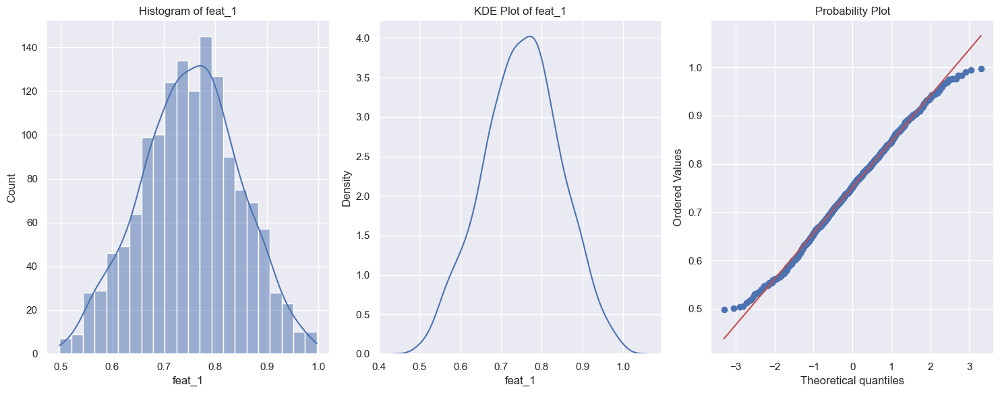

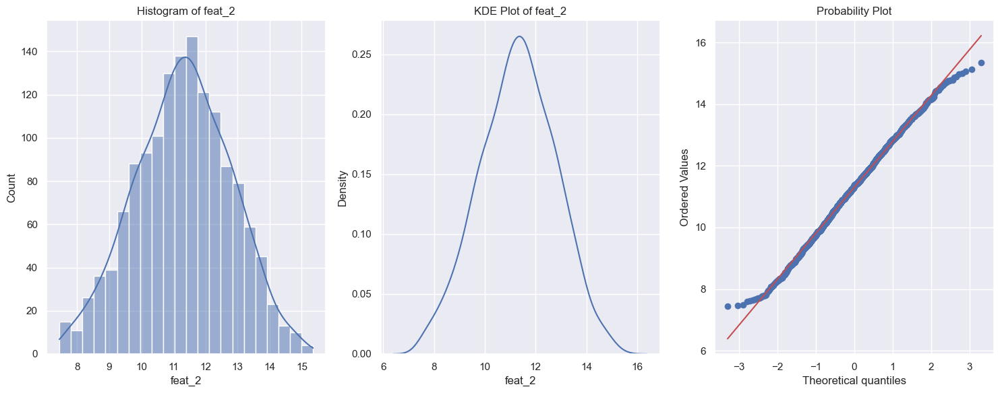

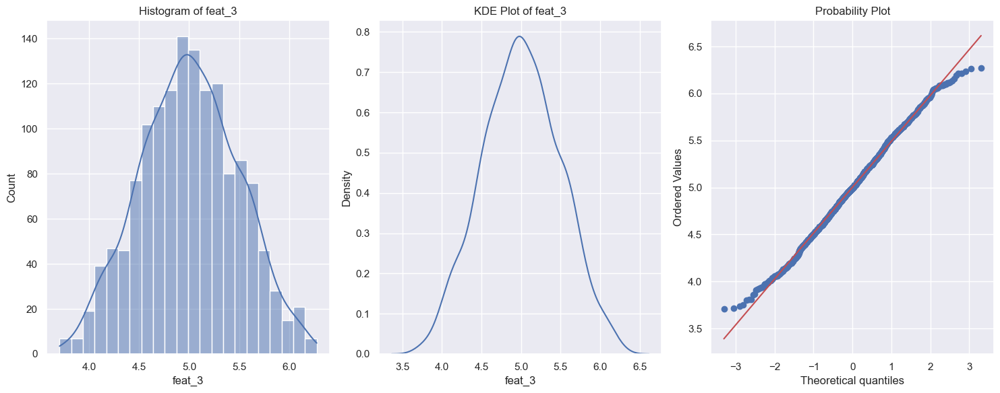

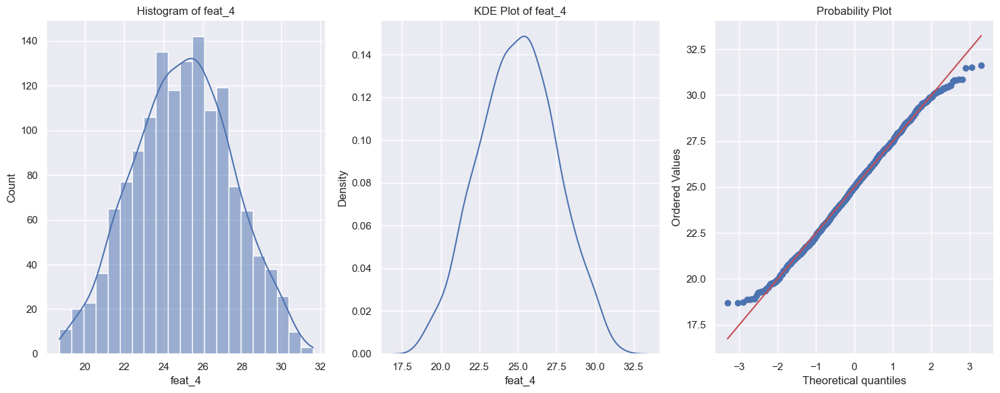

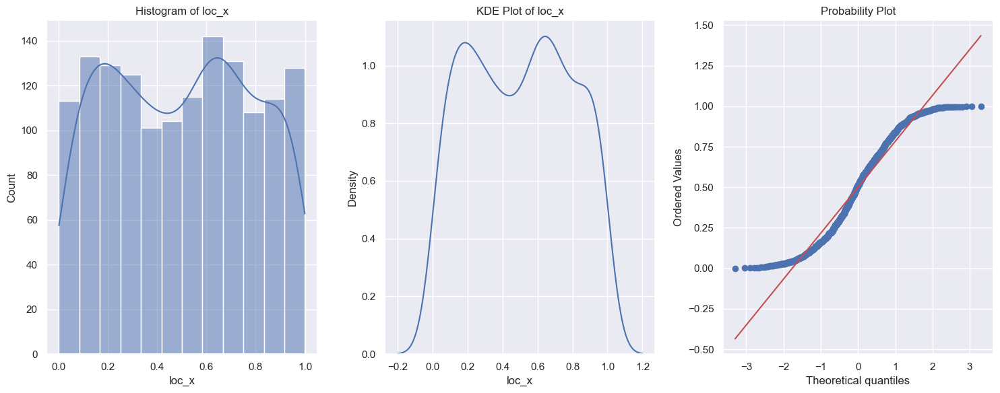

...

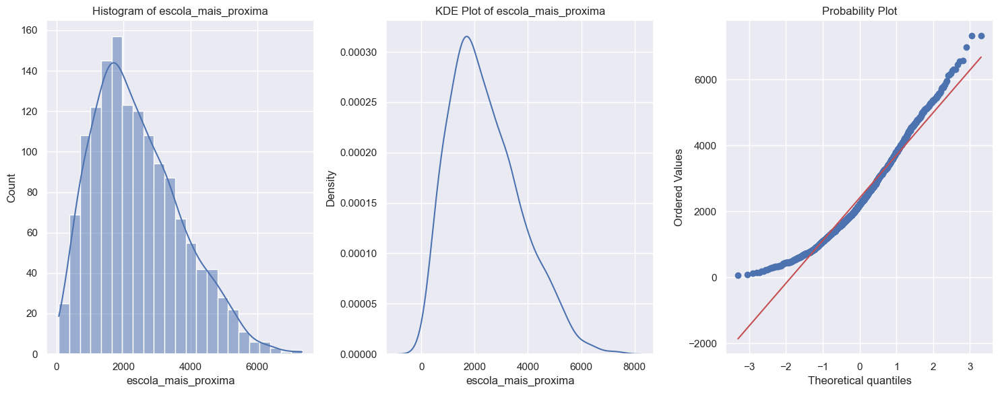

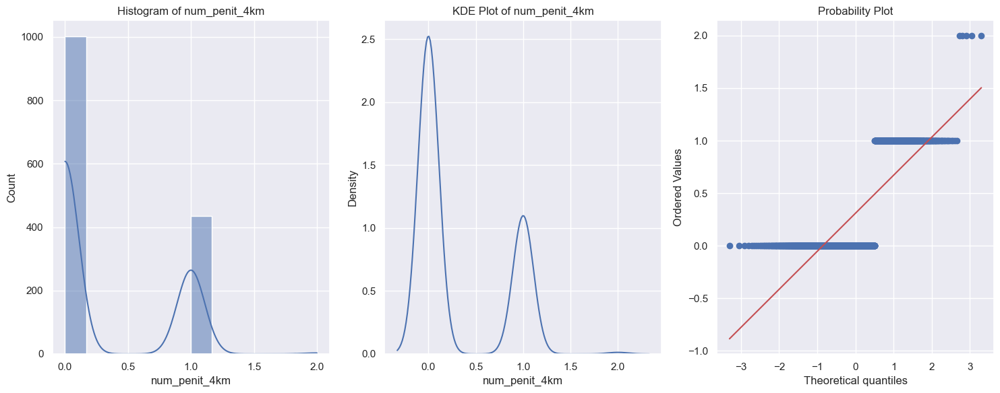

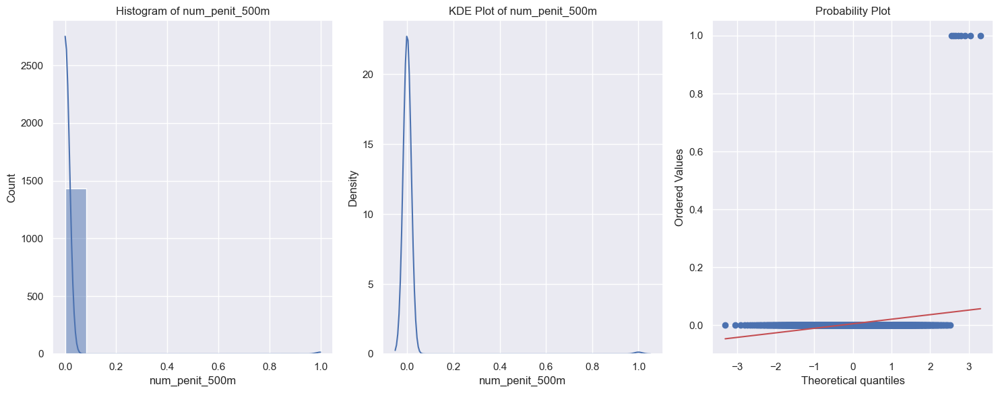

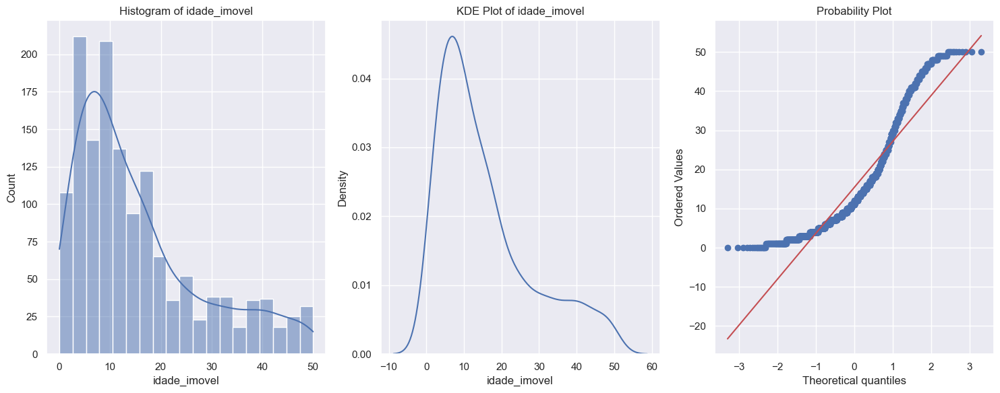

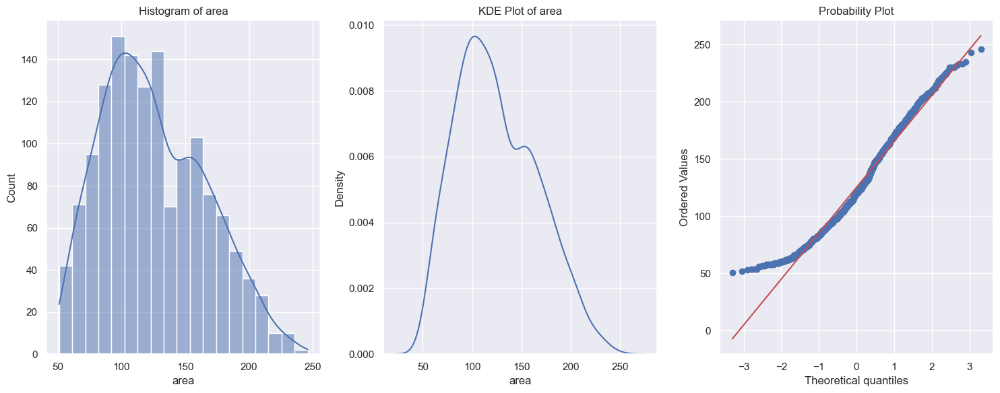

In [52]:
numeric_columns = ['feat_1', 'feat_2', 'feat_3', 'feat_4', 'loc_x', 'loc_y',
                   'mercado_mais_proximo', 'farmacia_mais_proxima', 'escola_mais_proxima',
                   'num_penit_4km', 'num_penit_500m', 'idade_imovel', 'area']

for column in numeric_columns:
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))
    
    # Plot 1: Histogram
    axes[0].set_title(f'Histogram of {column}')
    sns.histplot(data=dados, x=column, kde=True, ax=axes[0])
    
    # Plot 2: KDE Plot
    axes[1].set_title(f'KDE Plot of {column}')
    sns.kdeplot(data=dados, x=column, ax=axes[1])
    
    # Plot 3: Probability Plot
    axes[2].set_title(f'Probability Plot of {column}')
    stats.probplot(dados[column], dist="norm", plot=pylab)
    
    plt.tight_layout()
    plt.show()


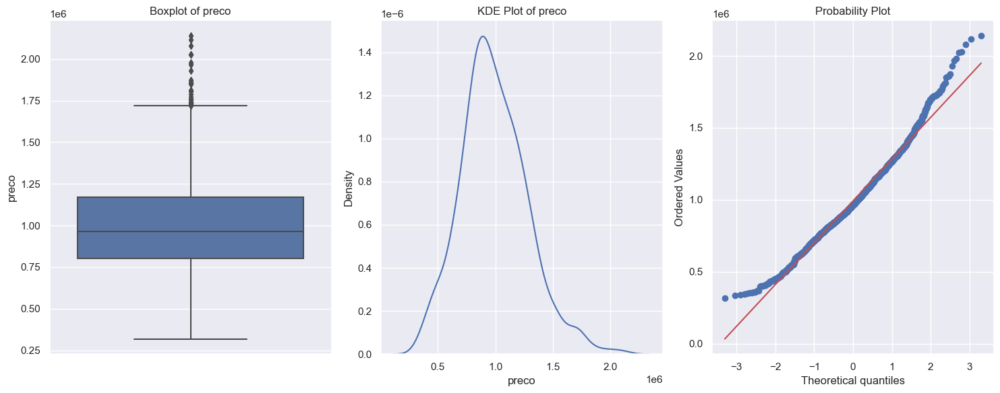

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(15, 6))

# Plot 1: Boxplot
axes[0].set_title('Boxplot of preco')
sns.boxplot(data=dados, y='preco', ax=axes[0])

# Plot 2: KDE Plot
axes[1].set_title('KDE Plot of preco')
sns.kdeplot(data=dados, x='preco', ax=axes[1])

# Plot 3: Probability Plot
axes[2].set_title('Probability Plot of preco')
stats.probplot(dados['preco'], dist="norm", plot=pylab)

plt.tight_layout()
plt.show()

#### Correlação entre variáveis numericas

In [54]:
# Select the numeric variables for correlation analysis
numeric_variables2 = ['feat_1', 'feat_2', 'feat_3', 'feat_4', 'loc_x', 'loc_y', 'mercado_mais_proximo', 'farmacia_mais_proxima', 'escola_mais_proxima', 'num_penit_4km', 'num_penit_500m', 'idade_imovel', 'area', 'preco']

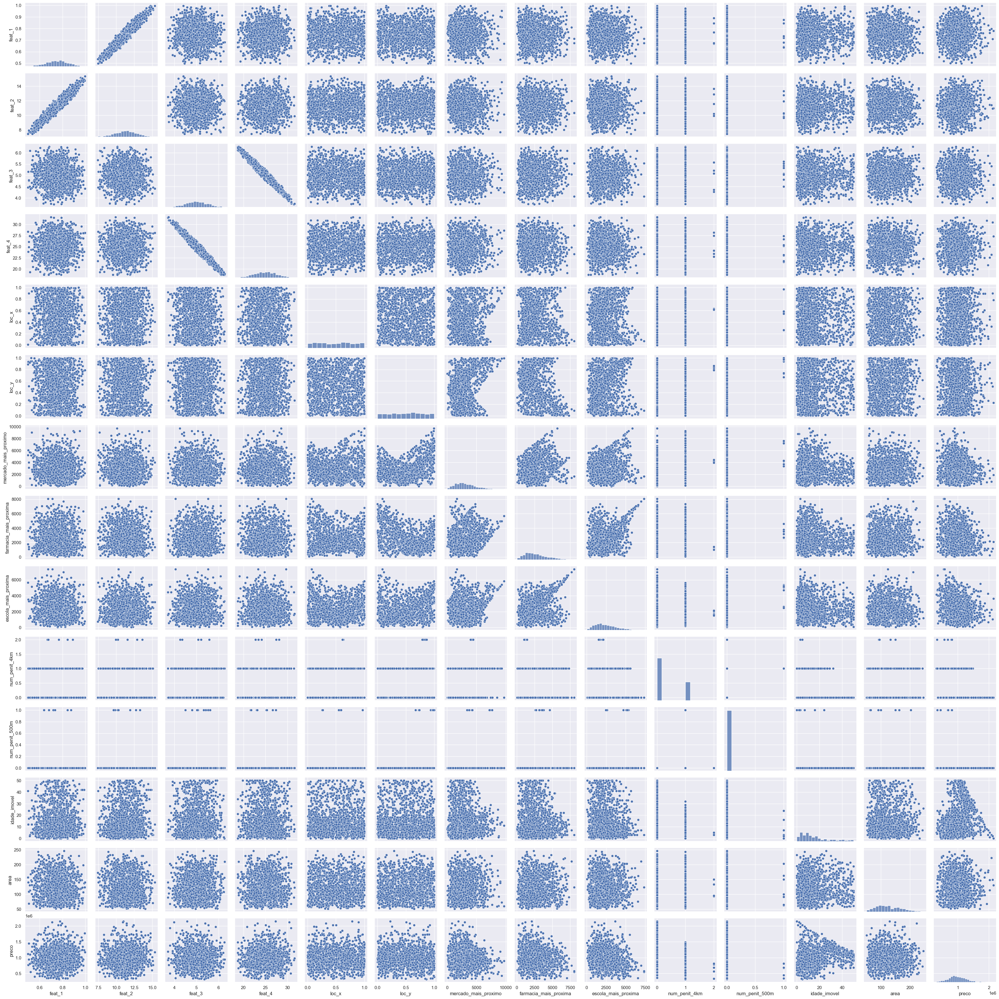

In [55]:
# Create the pair plot
sns.pairplot(dados[numeric_variables2])
plt.show()

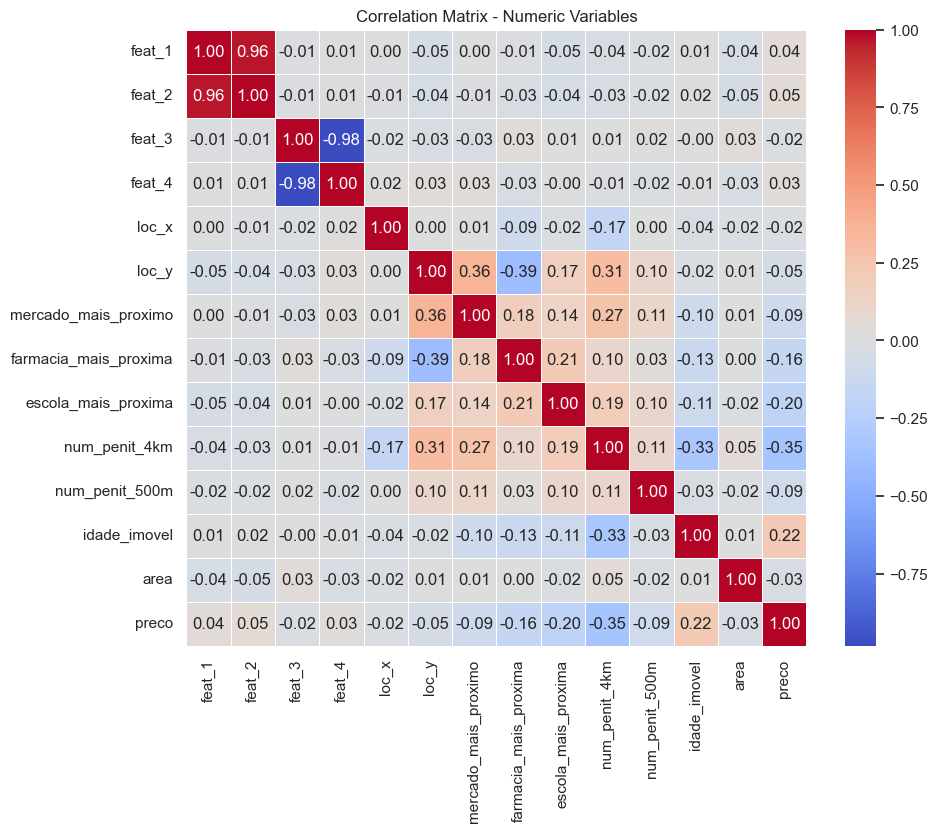

In [56]:
# Compute the correlation matrix
correlation_matrix = dados[numeric_variables2].corr()

# Generate the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix - Numeric Variables')
plt.show()

Principais Observações:

- Grupo 1 (Correlação Positiva Muito Forte):

    * feat_1 e feat_2: Apresentam uma correlação positiva muito forte, indicando que quando o valor de feat_1 aumenta, o valor de feat_2 também tende a aumentar.

- Grupo 2 (Correlação Negativa Muito Forte):

    * feat_3 e feat_4: Possuem uma correlação negativa muito forte, sugerindo que à medida que o valor de feat_3 aumenta, o valor de feat_4 tende a diminuir.

- Grupo 3 (Correlação Negativa Moderada):

    * loc_y e farmacia_mais_proxima: Apresentam uma correlação negativa moderada, indicando que quanto maior a distância da localização (loc_y) de uma farmácia mais próxima, menor é a sua proximidade com a mesma.

- Grupo 4 (Correlação Negativa Fraca):

    * loc_y e mercado_mais_proximo: Exibem uma correlação negativa fraca, sugerindo que a medida que a localização (loc_y) se afasta de um mercado mais próximo, há uma leve diminuição da proximidade com o mesmo.
    * loc_y e num_penit_4km: Apresentam uma correlação negativa fraca, indicando que à medida que a localização (loc_y) se afasta de uma penitenciária a uma distância de 4 km, a proximidade com a mesma diminui ligeiramente.
    * preco e num_penit_4km: Possuem uma correlação negativa fraca, sugerindo que à medida que o valor do preço diminui, a proximidade com uma penitenciária a uma distância de 4 km tende a aumentar.
    * preco e idade_imovel: Exibem uma correlação negativa fraca, indicando que à medida que o valor do preço diminui, a idade do imóvel tende a ser maior.
    * idade_imovel e num_penit_4km: Apresentam uma correlação negativa fraca, sugerindo que à medida que a idade do imóvel aumenta, a proximidade com uma penitenciária a uma distância de 4 km tende a diminuir.

- Grupo 5 (Correlação Positiva Fraca):

    * escola_mais_proxima e farmacia_mais_proxima: Possuem uma correlação positiva fraca, indicando que quanto maior a proximidade da localização com a escola mais próxima, maior é a proximidade com a farmácia mais próxima.

In [57]:
#### Variáveis Categóricas

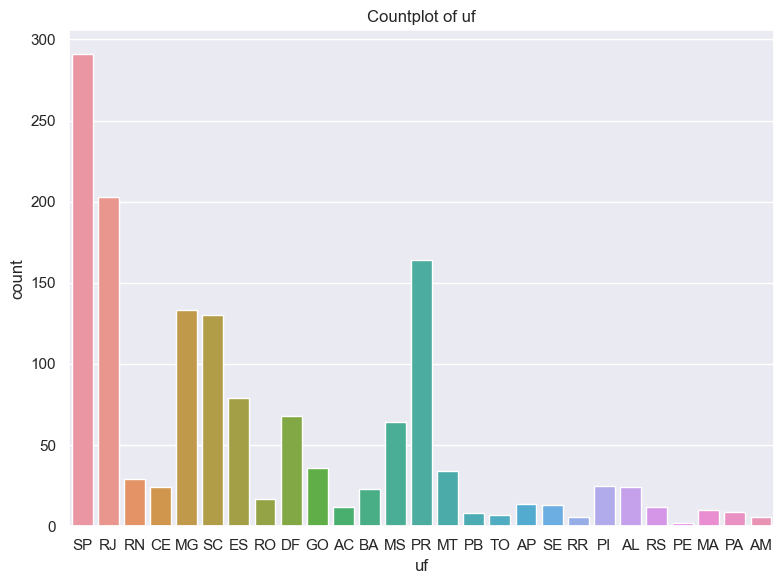

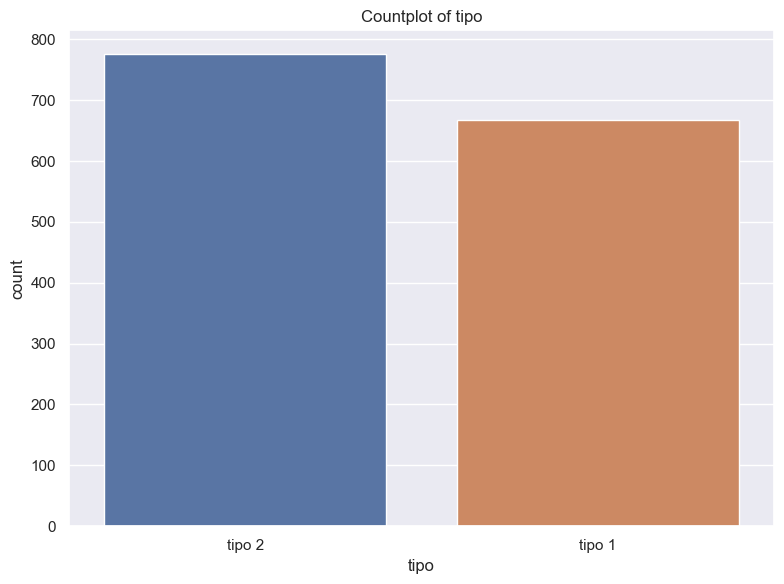

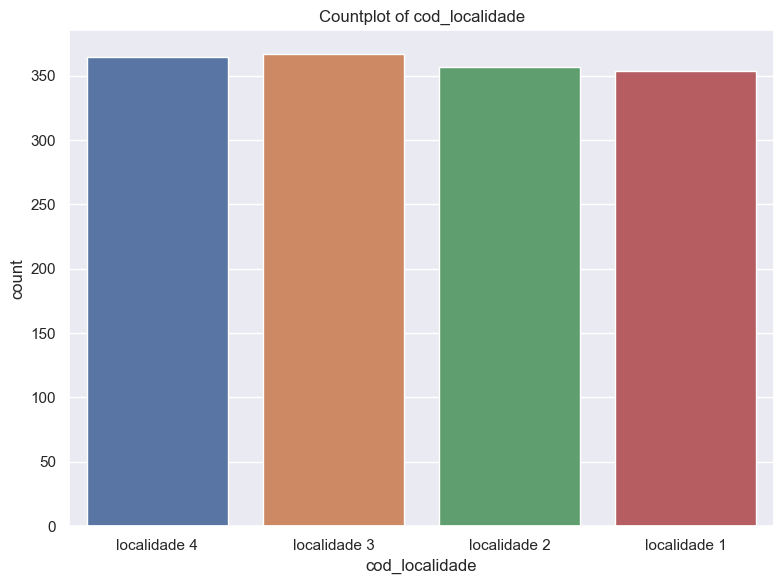

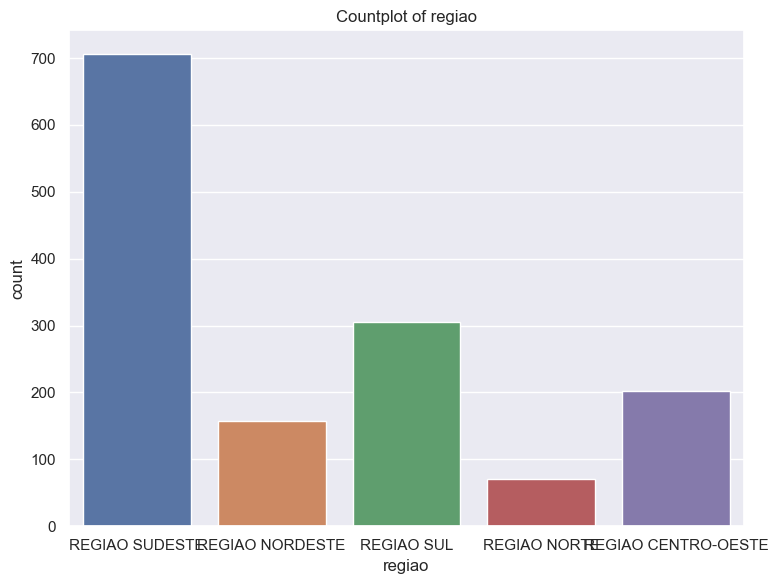

In [58]:
categorical_columns = ['uf', 'tipo', 'cod_localidade', 'regiao']

for column in categorical_columns:
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Plot: Countplot
    ax.set_title(f'Countplot of {column}')
    sns.countplot(data=dados, x=column, ax=ax)
    
    plt.tight_layout()
    plt.show()

In [59]:
#### Correlação entre variáveis Categóricas

In [60]:
# Tabela de contingência
contingency_table = pd.crosstab(index=dados[categorical_columns[0]], columns=dados[categorical_columns[1]])

# Exibir tabela de contingência
print("Tabela de Contingência:")
print(contingency_table)

Tabela de Contingência:
tipo  tipo 1  tipo 2
uf                  
AC         7       5
AL        10      14
AM         2       4
AP         7       7
BA        12      11
CE        12      12
DF        36      32
ES        36      43
GO        15      21
MA         4       6
MG        49      84
MS        33      31
MT        15      19
PA         4       5
PB         3       5
PE         0       2
PI        12      13
PR        71      93
RJ        85     118
RN        13      16
RO         7      10
RR         2       4
RS         6       6
SC        62      68
SE         6       7
SP       155     136
TO         3       4


In [61]:
# Análise de proporção
proportion_table = contingency_table.apply(lambda r: r/r.sum(), axis=1)

# Exibir tabela de proporção
print("\nTabela de Proporção:")
print(proportion_table)


Tabela de Proporção:
tipo    tipo 1    tipo 2
uf                      
AC    0.583333  0.416667
AL    0.416667  0.583333
AM    0.333333  0.666667
AP    0.500000  0.500000
BA    0.521739  0.478261
CE    0.500000  0.500000
DF    0.529412  0.470588
ES    0.455696  0.544304
GO    0.416667  0.583333
MA    0.400000  0.600000
MG    0.368421  0.631579
MS    0.515625  0.484375
MT    0.441176  0.558824
PA    0.444444  0.555556
PB    0.375000  0.625000
PE    0.000000  1.000000
PI    0.480000  0.520000
PR    0.432927  0.567073
RJ    0.418719  0.581281
RN    0.448276  0.551724
RO    0.411765  0.588235
RR    0.333333  0.666667
RS    0.500000  0.500000
SC    0.476923  0.523077
SE    0.461538  0.538462
SP    0.532646  0.467354
TO    0.428571  0.571429


In [62]:
# Teste de associação (Qui-quadrado)
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Exibir resultado do teste de associação
print("\nTeste de Associação (Qui-quadrado):")
print(f"Qui-quadrado: {chi2}")
print(f"p-valor: {p_value}")


Teste de Associação (Qui-quadrado):
Qui-quadrado: 19.799276250184025
p-valor: 0.8009720792270294


Principais Observações:

Ao analisar as informações das variáveis categóricas 'tipo' e 'uf', destacam-se algumas observações relevantes. A tabela de contingência revela a distribuição de frequência dos tipos de dados em cada estado. Por exemplo, o estado AC possui 7 ocorrências do 'tipo 1' e 5 ocorrências do 'tipo 2'. Já a tabela de proporção apresenta a relação percentual entre os tipos em cada estado. No AC, aproximadamente 58,33% das ocorrências correspondem ao 'tipo 1' e cerca de 41,67% são do 'tipo 2'. No entanto, o teste de associação (Qui-quadrado) indica que não há uma relação estatisticamente significativa entre os tipos de dados e os estados, uma vez que o valor-p obtido (0,801) é maior que o nível de significância usual de 0,05. Portanto, conclui-se que embora haja variação na distribuição dos tipos de dados entre os estados, essa variação não está associada de forma significativa às diferentes regiões.

In [63]:
dados.to_parquet("dados_tratados.parquet")